# merging

In [1]:
import pandas as pd 

edges_df = pd.read_csv("/Users/ghadena/Desktop/geopol/notebooks/edges.csv")
# 1. Load your data file

article_data = pd.read_csv("/Users/ghadena/Desktop/geopol/notebooks/data.csv")
article_data = article_data.rename(columns={"source": "article_source"})

# 2. Select only the necessary columns: URL, source, and date
# 🔁 Replace 'article_source' and 'date' if your column names are different
meta_columns = article_data[["url", "article_source", "date", "is_relevant"]].drop_duplicates()

# 3. Merge into edges_df on the URL column
edges_df = edges_df.merge(meta_columns, on="url", how="left")


In [2]:
edges_df.is_relevant.value_counts()

is_relevant
0.0    14385
1.0     5814
Name: count, dtype: int64

In [3]:
edges_df_filtered = edges_df[edges_df["is_relevant"] == 1].copy()

In [16]:
edges_df_filtered

,source,target,relationship,sentiment,url,article_source,date,is_relevant
3,Emmanuel Macron,Elon Musk,criticizes,HOSTILE,https://www.rfi.fr/en/international/20250108-m...,french,2025-01-08,1.0
4,Starmer,Elon Musk,criticizes,HOSTILE,https://www.rfi.fr/en/international/20250108-m...,french,2025-01-08,1.0
7,Emmanuel Macron,United States,opposes,HOSTILE,https://www.rfi.fr/en/france/20250404-french-i...,french,2025-04-04,1.0
9,Emmanuel Macron,France,leads,NEUTRAL,https://www.rfi.fr/en/france/20250319-macron-s...,french,2025-03-19,1.0
10,Emmanuel Macron,France,leads,NEUTRAL,https://www.rfi.fr/en/france/20250317-macron-t...,french,2025-03-17,1.0
...,...,...,...,...,...,...,...,...
20096,Rachel Reeves,UK Finance,supports,FRIENDLY,https://www.politico.eu/newsletter/politico-lo...,us,2024-11-21,1.0
20097,Tulip Siddiq,UK Finance,supports,FRIENDLY,https://www.politico.eu/newsletter/politico-lo...,us,2024-11-21,1.0
20113,Balázs Orbán,Viktor Orban,represents,NEUTRAL,https://www.euronews.com/2024/11/19/the-result...,us,2024-11-19,1.0
20114,Donald Trump,Republican Party,leads,NEUTRAL,https://www.euronews.com/2024/11/19/the-result...,us,2024-11-19,1.0


In [124]:
#edges_df_filtered.to_csv("edges_new_filtered.csv", index=False)

# running app locally 

In [1]:
import os
import sys
import webbrowser
from threading import Timer

# Add parent directory (where KG_dashboard lives) to path
sys.path.append('..')

# ✅ Now import the app from the dashboard module
from KG_dashboard import app_enhanced
app = app_enhanced.app

# Optional: auto-open browser
def open_browser():
    webbrowser.open('http://localhost:5757')

if __name__ == "__main__":
    print("Current working directory:", os.getcwd())
    Timer(1.5, open_browser).start()
    app.run(port=5757, debug=True, use_reloader=False)

Current working directory: /Users/ghadena/Desktop/geopol/notebooks
 * Serving Flask app 'KG_dashboard.app_enhanced'
 * Debug mode: on


 * Running on http://127.0.0.1:5757
Press CTRL+C to quit
127.0.0.1 - - [24/May/2025 14:54:37] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [24/May/2025 14:54:37] "GET /static/js/graph.js HTTP/1.1" 304 -
127.0.0.1 - - [24/May/2025 14:54:38] "GET /data?sentiment=All&relationship=All&search=&direction=all&start_date=&end_date=&article_source=us HTTP/1.1" 200 -
127.0.0.1 - - [24/May/2025 14:54:45] "GET /data?sentiment=All&relationship=All&search=&direction=all&start_date=&end_date=&article_source=french HTTP/1.1" 200 -
127.0.0.1 - - [24/May/2025 14:54:49] "GET /data?sentiment=All&relationship=All&search=&direction=all&start_date=&end_date=&article_source=german HTTP/1.1" 200 -


# 📘 Knowledge Graph Schema

This knowledge graph uses an open schema driven by LLM-based entity and relationship extraction. It includes five main node types:

- `Person`
- `Organization`
- `Location`
- `Political Parties`


Relationships are dynamically inferred from news article text using LLMs. The top five most frequent relationships are: `supports`, `opposes`, `criticizes`, `partners with`, and `accuses`. In total, 99 unique relationships were identified.

Each edge contains metadata:
- `relationship` (string)
- `to` and `from` : names of nodes 
- `sentiment`: `NEUTRAL`, `HOSTILE`, or `FRIENDLY`
- `date` of article
- `source_url`

Each node includes name, type, centrality metrics, and number of incoming vs outgoing edges.

Sentiment is distributed as follows:
- NEUTRAL: 
- HOSTILE: 
- FRIENDLY:

The schema supports highly expressive and contextual relationship types, making it well-suited for exploratory analysis of political media.

# us graph analytics (old)

In [18]:
import pandas as pd
import networkx as nx
from community import community_louvain

# Load your data
edges_df = pd.read_csv("edges.csv")
entities_df = pd.read_csv("entities.csv")
entities_df = entities_df.drop_duplicates(subset="entity")

# Clean column names just in case
edges_df.columns = edges_df.columns.str.strip().str.lower()
entities_df.columns = entities_df.columns.str.strip().str.lower()

# Create directed graph from edges
G = nx.from_pandas_edgelist(edges_df, source="source", target="target", create_using=nx.DiGraph())

# --- Node-level metrics ---
degree_centrality = nx.degree_centrality(G)
in_degree = dict(G.in_degree())
out_degree = dict(G.out_degree())
betweenness = nx.betweenness_centrality(G)
eigenvector = nx.eigenvector_centrality(G, max_iter=1000)
partition = community_louvain.best_partition(G.to_undirected())

# Create node-level DataFrame
node_metrics = pd.DataFrame({
    "entity": list(G.nodes()),
    "degree_centrality": [degree_centrality.get(n, 0) for n in G.nodes()],
    "in_degree": [in_degree.get(n, 0) for n in G.nodes()],
    "out_degree": [out_degree.get(n, 0) for n in G.nodes()],
    "betweenness": [betweenness.get(n, 0) for n in G.nodes()],
    "eigenvector": [eigenvector.get(n, 0) for n in G.nodes()],
    "community": [partition.get(n, -1) for n in G.nodes()],
})

# Join with entity types if available
node_metrics = node_metrics.merge(
    entities_df.rename(columns={"entity": "entity", "entity_type": "type"}),
    on="entity",
    how="left"
)

# --- Graph-level metrics ---
graph_summary = {
    "num_nodes": G.number_of_nodes(),
    "num_edges": G.number_of_edges(),
    "density": nx.density(G),
    "connected_components": nx.number_weakly_connected_components(G)
}

try:
    graph_summary["avg_shortest_path"] = nx.average_shortest_path_length(G)
except:
    graph_summary["avg_shortest_path"] = "Not connected"

# Display the node-level metrics
print("📊 Node-Level Metrics (first 10 rows):")
display(node_metrics.head(10))

# Display graph-level summary
print("\n🌐 Graph-Level Summary:")
for key, value in graph_summary.items():
    print(f"{key}: {value}")

📊 Node-Level Metrics (first 10 rows):


,entity,degree_centrality,in_degree,out_degree,betweenness,eigenvector,community,unnamed: 0,url,date,type
0,Donald Trump,0.523050,368,517,0.169892,3.831810e-01,0,0.0,https://www.nytimes.com/live/2024/09/09/us/har...,2024-09-09,people
1,women,0.004728,8,0,0.000000,5.552652e-02,1,NaN,NaN,NaN,NaN
2,President Biden,0.001182,1,1,0.000280,3.194336e-02,2,22.0,https://www.nytimes.com/live/2024/09/09/us/har...,2024-09-09,people
3,Marco Rubio,0.004137,1,6,0.000235,3.194336e-02,7,2.0,https://www.nytimes.com/live/2024/09/09/us/har...,2024-09-09,people
4,Ted Cruz,0.002364,1,3,0.000235,3.194336e-02,1,3.0,https://www.nytimes.com/live/2024/09/09/us/har...,2024-09-09,people
5,Kamala Harris,0.154846,111,151,0.035606,1.485087e-01,2,1.0,https://www.nytimes.com/live/2024/09/09/us/har...,2024-09-09,people
6,Hillary Clinton,0.004728,4,4,0.000058,3.897228e-02,5,4.0,https://www.nytimes.com/live/2024/09/09/us/har...,2024-09-09,people
7,Megyn Kelly,0.000591,1,0,0.000000,3.194336e-02,0,7.0,https://www.nytimes.com/live/2024/09/09/us/har...,2024-09-09,people
8,Carly Fiorina,0.001182,1,1,0.000000,3.194336e-02,0,12.0,https://www.nytimes.com/live/2024/09/09/us/har...,2024-09-09,people
9,Karoline Leavitt,0.001182,0,2,0.000000,9.058835e-36,2,5.0,https://www.nytimes.com/live/2024/09/09/us/har...,2024-09-09,people



🌐 Graph-Level Summary:
num_nodes: 1693
num_edges: 2554
density: 0.0008915866891762632
connected_components: 81
avg_shortest_path: Not connected


visualizing the largest connected component 

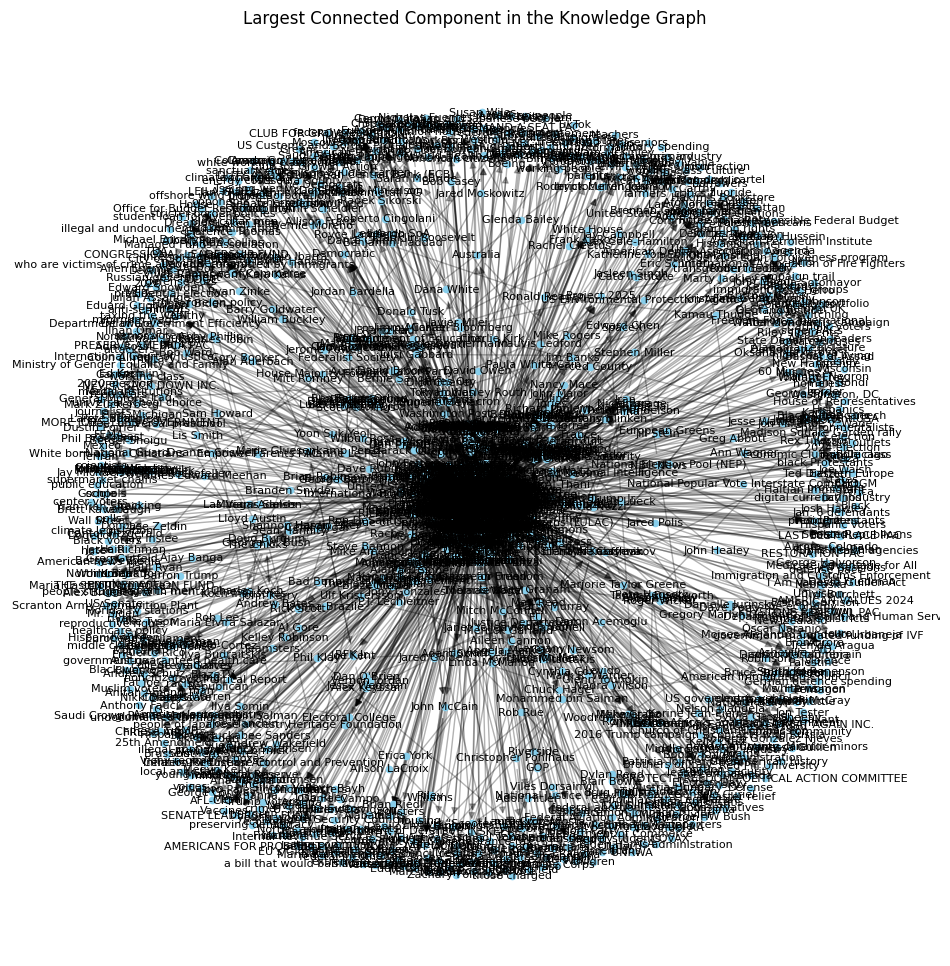

In [21]:
import matplotlib.pyplot as plt

# Find the largest connected component
largest_cc = max(nx.weakly_connected_components(G), key=len)
subG = G.subgraph(largest_cc)

# Optional: use spring layout for nice spacing
pos = nx.spring_layout(subG, seed=42)

# Draw it
plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(subG, pos, node_size=20, node_color="skyblue")
nx.draw_networkx_edges(subG, pos, alpha=0.3, arrows=True)
nx.draw_networkx_labels(subG, pos, font_size=8, font_color="black")

plt.title("Largest Connected Component in the Knowledge Graph")
plt.axis("off")
plt.show()

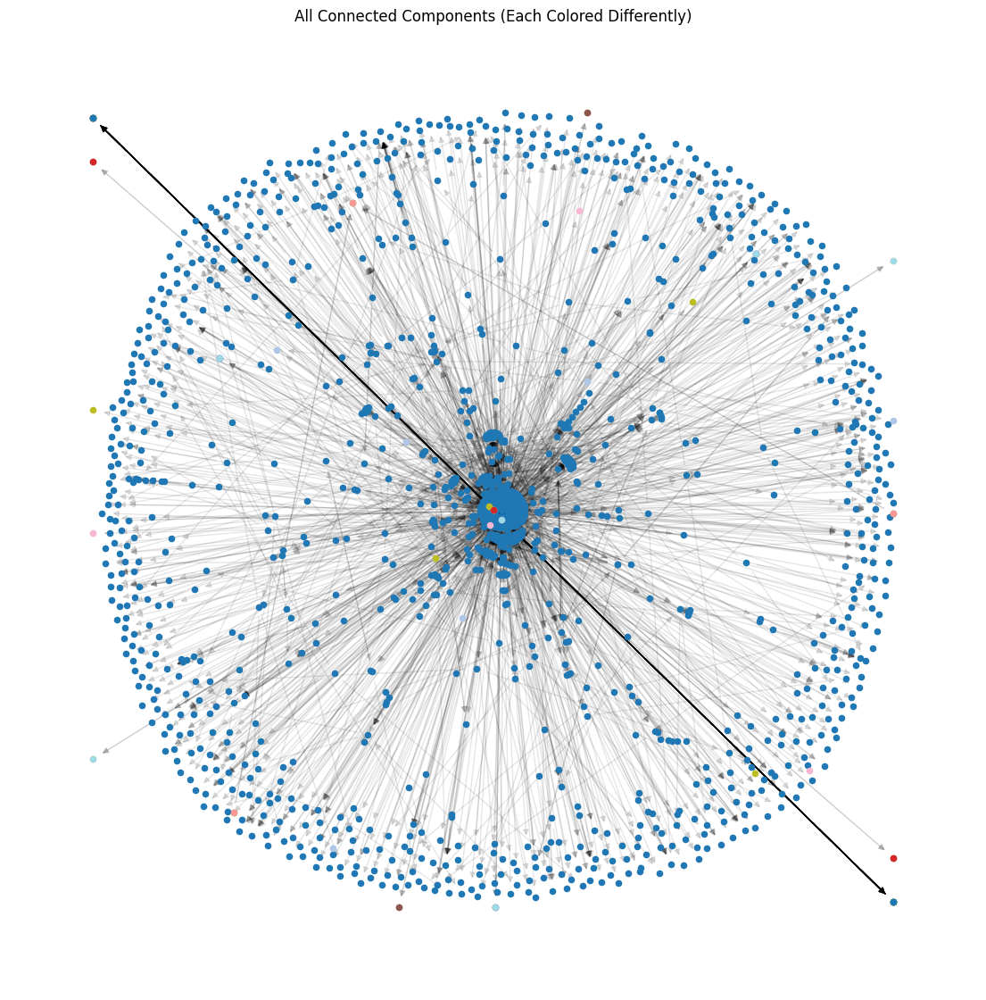

In [23]:
components = list(nx.weakly_connected_components(G))
colors = plt.cm.tab20(range(len(components)))

plt.figure(figsize=(14, 14))
for i, comp in enumerate(components):
    subG = G.subgraph(comp)
    pos = nx.spring_layout(subG, seed=42)
    nx.draw_networkx_nodes(subG, pos, node_size=20, node_color=[colors[i % 20]])
    nx.draw_networkx_edges(subG, pos, alpha=0.1)

plt.title("All Connected Components (Each Colored Differently)")
plt.axis("off")
plt.show()

avg shortest path in the largest component 


In [24]:
# Get the largest connected component (as a subgraph)
largest_cc = max(nx.weakly_connected_components(G), key=len)
subgraph = G.subgraph(largest_cc)

avg_path = nx.average_shortest_path_length(subG.to_undirected())
print("Average shortest path length (undirected):", avg_path)

Average shortest path length (undirected): 1.0


In [25]:
# Get the largest strongly connected component
strongest_cc = max(nx.strongly_connected_components(G), key=len)
subG_strong = G.subgraph(strongest_cc)

# Now this will work:
avg_path = nx.average_shortest_path_length(subG_strong)
print("Average shortest path length (strongest component):", avg_path)

Average shortest path length (strongest component): 2.7370786014486272


/var/folders/nx/lwphb_yx3312gqm2v4zgwnr00000gn/T/ipykernel_78344/3613677460.py:43: UserWarning: Glyph 127760 (\N{GLOBE WITH MERIDIANS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/nx/lwphb_yx3312gqm2v4zgwnr00000gn/T/ipykernel_78344/3613677460.py:43: UserWarning: Glyph 128257 (\N{CLOCKWISE RIGHTWARDS AND LEFTWARDS OPEN CIRCLE ARROWS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/ghadena/Desktop/geopol/.venv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 127760 (\N{GLOBE WITH MERIDIANS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/ghadena/Desktop/geopol/.venv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128257 (\N{CLOCKWISE RIGHTWARDS AND LEFTWARDS OPEN CIRCLE ARROWS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


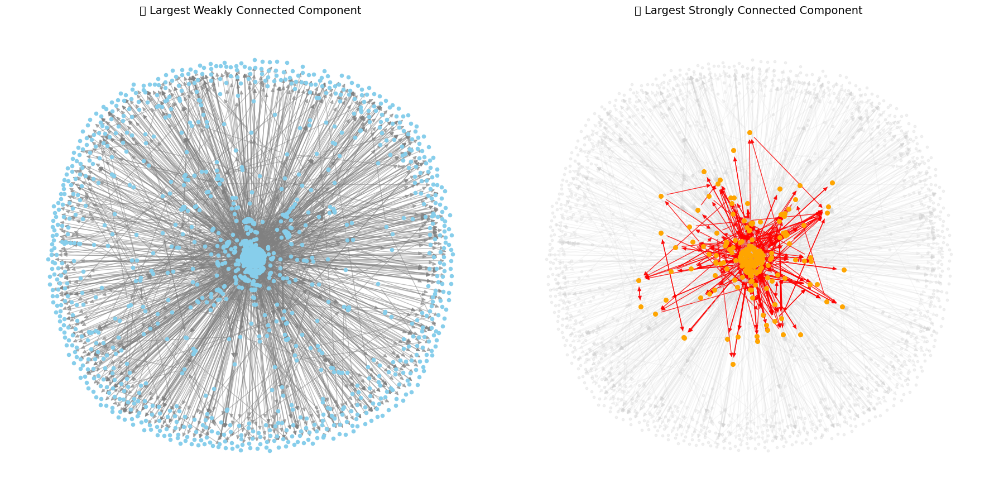

In [26]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Load your edge list
edges_df = pd.read_csv("edges.csv")

# Clean column names just in case
edges_df.columns = edges_df.columns.str.strip().str.lower()

# Create a directed graph
G = nx.from_pandas_edgelist(edges_df, source="source", target="target", create_using=nx.DiGraph())

# Find the largest weakly connected component
largest_weak = max(nx.weakly_connected_components(G), key=len)
subG_weak = G.subgraph(largest_weak)

# Find the largest strongly connected component
largest_strong = max(nx.strongly_connected_components(G), key=len)
subG_strong = G.subgraph(largest_strong)

# Use spring layout for consistent node positioning
pos_weak = nx.spring_layout(subG_weak, seed=42)
pos_strong = {n: pos_weak[n] for n in subG_strong.nodes()}

# Set up the plot
fig, axs = plt.subplots(1, 2, figsize=(18, 9))

# Plot largest weakly connected component
axs[0].set_title("🌐 Largest Weakly Connected Component", fontsize=14)
nx.draw_networkx_nodes(subG_weak, pos_weak, ax=axs[0], node_size=20, node_color="skyblue")
nx.draw_networkx_edges(subG_weak, pos_weak, ax=axs[0], edge_color="gray", alpha=0.5, arrows=True)
axs[0].axis("off")

# Plot strongly connected component overlaid
axs[1].set_title("🔁 Largest Strongly Connected Component", fontsize=14)
nx.draw_networkx_nodes(subG_weak, pos_weak, ax=axs[1], node_size=10, node_color="lightgray", alpha=0.3)
nx.draw_networkx_edges(subG_weak, pos_weak, ax=axs[1], edge_color="lightgray", alpha=0.2)
nx.draw_networkx_nodes(subG_strong, pos_strong, ax=axs[1], node_size=30, node_color="orange")
nx.draw_networkx_edges(subG_strong, pos_strong, ax=axs[1], edge_color="red", alpha=0.8, arrows=True)
axs[1].axis("off")

plt.tight_layout()
plt.show()

### Node-Level Metrics

- **Donald Trump dominates the network** with the highest degree centrality (0.52), betweenness, and eigenvector centrality, indicating that he is both the most connected and the most structurally important entity.  
  **Interpretation**: He is the central figure across sources and narratives, acting as a hub of relationships.

- **Kamala Harris** ranks high in degree centrality and eigenvector score, confirming her structural importance despite appearing lower in basic ranking lists.  
  **Interpretation**: Kamala is part of multiple important sub-networks and should be considered a strategically connected actor.

- The entity **"women"** appears prominently despite having low actual connectivity (in-degree only, no out-degree).  
  **Interpretation**: Generic or thematic entities can appear frequently without meaningful structural influence. They should be analyzed separately from actors.

- **Community detection** via Louvain algorithm segments the graph into modular groups of related entities.  
  **Interpretation**: These communities reflect media-driven clusters, useful for targeted narrative or sentiment analysis.

### Graph-Level Metrics

- The graph has a **very low density** (0.0009), suggesting that while it is large, the majority of nodes are not directly connected.  
  **Interpretation**: The political discourse is fragmented, with many actors mentioned in isolation or within niche topics.

- There are **81 weakly connected components**, meaning the graph is highly fragmented when ignoring edge direction.  
  **Interpretation**: Many narratives or articles introduce new entities or local clusters without linking them to the core political discourse.

- **Average shortest path length (strongest component)** is 2.737, indicating that information within the core network can propagate within 2–3 steps.  
  **Interpretation**: This is structurally efficient; actors within this core are closely interconnected.

- **Average shortest path length (undirected)** for the largest weakly connected component is 1.0, indicating extremely tight coupling once direction is ignored.  
  **Interpretation**: The undirected structure may reflect heavy use of common hubs or recurring co-mentions, creating shortcut-rich structures.

### Structural Takeaways

- **The largest strongly connected component** (visualized in orange/red) shows a densely interconnected core that is significantly smaller than the weakly connected outer network.  
  **Interpretation**: Actionable insights should prioritize this core as the most information-rich region for classifier training and sentiment tracking.

- **Peripheral subgraphs** are disconnected from the main discourse.  
  **Interpretation**: These components may represent unique narratives, isolated events, or one-off mentions and should be analyzed for outlier patterns or emerging topics.

- **High centrality actors** should be prioritized for:
  - Node-based classification
  - Subgraph expansion
  - Temporal tracking of sentiment and relationship dynamics

## community size & composition

,size
0,457
2,159
8,127
6,123
13,121
5,95
1,81
7,64
10,44
11,42


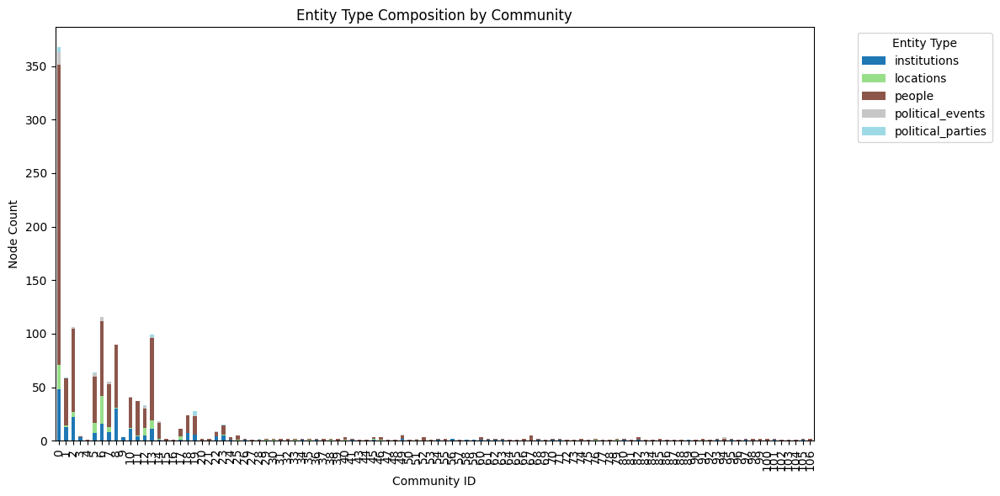

In [35]:



from collections import Counter

# Community sizes
community_sizes = Counter(partition.values())
sizes_df = pd.DataFrame.from_dict(community_sizes, orient='index', columns=["size"]).sort_values(by="size", ascending=False)
display(sizes_df.head(10))
# Distribution of entity types per community
entity_distribution = node_metrics.groupby(['community', 'type']).size().unstack(fill_value=0)
entity_distribution.sort_index().plot(kind="bar", stacked=True, figsize=(12, 6), colormap="tab20")
plt.title("Entity Type Composition by Community")
plt.ylabel("Node Count")
plt.xlabel("Community ID")
plt.legend(title="Entity Type", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

In [29]:
node_metrics['community'] = node_metrics['community'].astype(int)

top_per_cluster = node_metrics.sort_values(by='degree_centrality', ascending=False).groupby('community').head(5)
top_per_cluster

,entity,degree_centrality,in_degree,out_degree,betweenness,eigenvector,community,unnamed: 0,url,date,type
0,Donald Trump,0.523050,368,517,0.169892,3.831810e-01,0,0.0,https://www.nytimes.com/live/2024/09/09/us/har...,2024-09-09,people
5,Kamala Harris,0.154846,111,151,0.035606,1.485087e-01,2,1.0,https://www.nytimes.com/live/2024/09/09/us/har...,2024-09-09,people
26,Joe Biden,0.067967,40,75,0.009348,1.132380e-01,5,90.0,https://www.nytimes.com/2024/09/06/us/politics...,2024-09-06,people
50,Democratic Party,0.043144,45,28,0.009827,8.681402e-02,13,124.0,https://www.nytimes.com/2024/09/10/technology/...,2024-09-10,political_parties
53,Republican Party,0.040780,31,38,0.010526,8.083451e-02,13,140.0,https://www.washingtonpost.com/politics/2024/0...,2024-09-09,political_parties
...,...,...,...,...,...,...,...,...,...,...,...
758,DEMOCRACY PAC,0.000591,1,0,0.000000,2.808239e-34,58,NaN,NaN,NaN,NaN
757,Fund for Policy Reform,0.000591,0,1,0.000000,9.058835e-36,58,5997.0,https://www.washingtonpost.com/elections/inter...,2024-10-28,institutions
792,Clark County Auditor’s office,0.000591,0,1,0.000000,9.058835e-36,61,6206.0,https://www.cnn.com/2024/10/28/us/ballot-box-f...,2024-10-28,institutions
790,Amanda McMillan,0.000591,1,0,0.000000,2.808239e-34,60,6186.0,https://www.cnn.com/2024/10/28/us/ballot-box-f...,2024-10-28,people


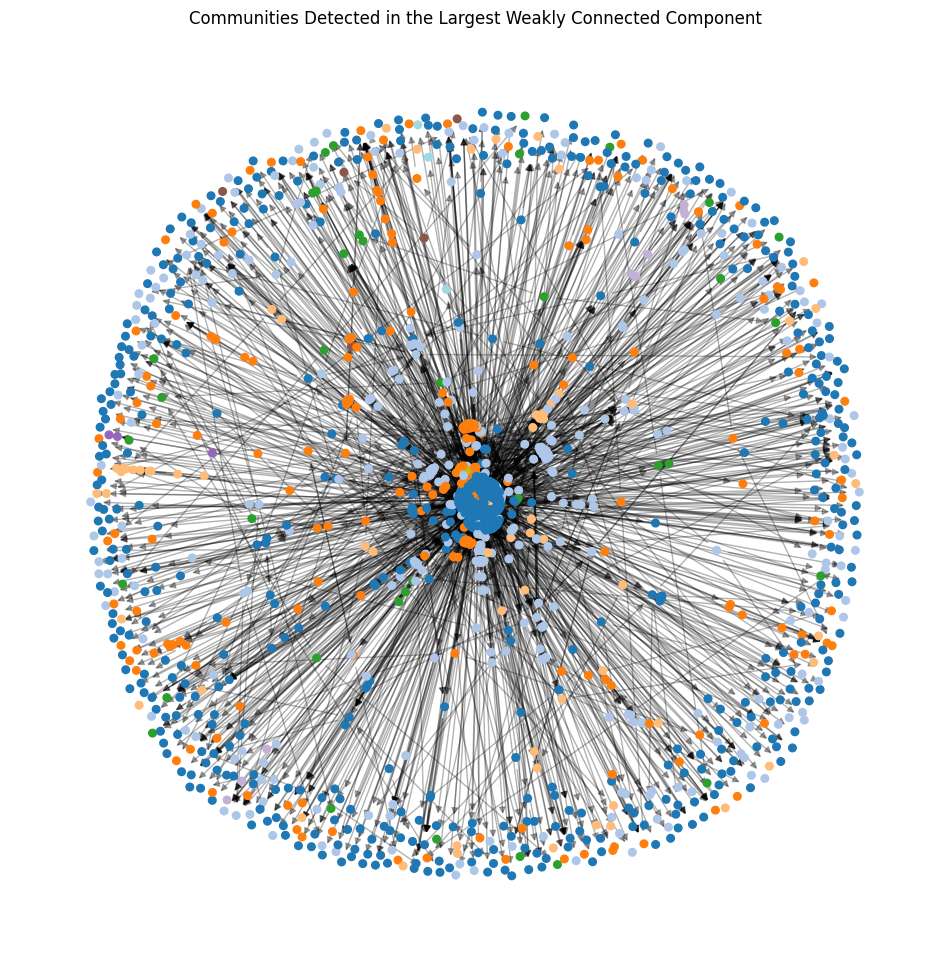

In [30]:
import matplotlib.pyplot as plt

# Color nodes by community
colors = [partition[node] for node in subG_weak.nodes()]
pos = nx.spring_layout(subG_weak, seed=42)

plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(subG_weak, pos, node_size=30, node_color=colors, cmap=plt.cm.tab20)
nx.draw_networkx_edges(subG_weak, pos, alpha=0.3)
plt.title("Communities Detected in the Largest Weakly Connected Component")
plt.axis("off")
plt.show()

In [31]:
def count_inter_community_edges(G, partition):
    inter_edges = 0
    for u, v in G.edges():
        if partition[u] != partition[v]:
            inter_edges += 1
    return inter_edges

inter_community_edges = count_inter_community_edges(G, partition)
print("Inter-community edges:", inter_community_edges)

Inter-community edges: 727


# comparative analytics of the 3 graphs 


In [6]:
import networkx as nx
import pandas as pd
from collections import defaultdict, Counter
import matplotlib.pyplot as plt
import seaborn as sns
import nxviz as nv


In [17]:
edges_df = pd.read_csv("https://raw.githubusercontent.com/ghadena/geopol/refs/heads/main/KG_dashboard/data/edges_new_filtered.csv")
entities_df = pd.read_csv("https://raw.githubusercontent.com/ghadena/geopol/refs/heads/main/KG_dashboard/data/ents_long.csv")

def build_graph_from_df(df_edges, df_entities):
    entity_type_lookup = df_entities.set_index("entity")["entity_type"].to_dict()

    G = nx.DiGraph()
    for _, row in df_edges.iterrows():
        src = row["source"]
        tgt = row["target"]

        G.add_node(src, entity_type=entity_type_lookup.get(src, "Unknown"))
        G.add_node(tgt, entity_type=entity_type_lookup.get(tgt, "Unknown"))

        G.add_edge(
            src, tgt,
            relationship=row["relationship"],
            sentiment=row["sentiment"],
            date=row["date"],
            source_url=row["url"]
        )

    return G


In [20]:
G_us = build_graph_from_df(edges_df[edges_df["article_source"] == "us"], entities_df) 
G_french = build_graph_from_df(edges_df[edges_df["article_source"] == "french"], entities_df)
G_german = build_graph_from_df(edges_df[edges_df["article_source"] == "german"], entities_df)

In [45]:
def visualize_graph(G, title):
    import matplotlib.pyplot as plt
    import networkx as nx
    from matplotlib.patches import Patch

    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(G, seed=42)

    # Predefined color palette for your actual entity types
    predefined_colors = {
        "locations": "#1f77b4",         # blue
        "institutions": "#2ca02c",      # green
        "people": "#ff7f0e",            # orange
        "political_events": "#d62728",  # red
        "political_parties": "#9467bd", # purple
        "unknown": "#7f7f7f"            # gray fallback
    }

    # Get node colors based on entity_type
    node_types = [G.nodes[n].get("entity_type", "unknown") for n in G.nodes()]
    node_colors = [predefined_colors.get(t, predefined_colors["unknown"]) for t in node_types]

    # Edge colors by sentiment
    edge_colors = []
    for _, _, data in G.edges(data=True):
        sentiment = data.get("sentiment", "neutral")
        if sentiment == "positive":
            edge_colors.append("green")
        elif sentiment == "negative":
            edge_colors.append("red")
        else:
            edge_colors.append("gray")

    # Draw graph
    nx.draw_networkx_nodes(G, pos, node_size=400, node_color=node_colors)
    

    for (u, v), color in zip(G.edges(), edge_colors):
        nx.draw_networkx_edges(G, pos, edgelist=[(u, v)],
                               connectionstyle='arc3,rad=0.2',
                               edge_color=color, alpha=0.4)

    # Create and show legend
    legend_elements = [Patch(facecolor=color, label=etype.replace("_", " ").capitalize())
                       for etype, color in predefined_colors.items()]
    plt.legend(handles=legend_elements, title="Entity Types", loc="upper right", fontsize=9)

    plt.title(title)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [46]:
import warnings
warnings.filterwarnings("ignore")

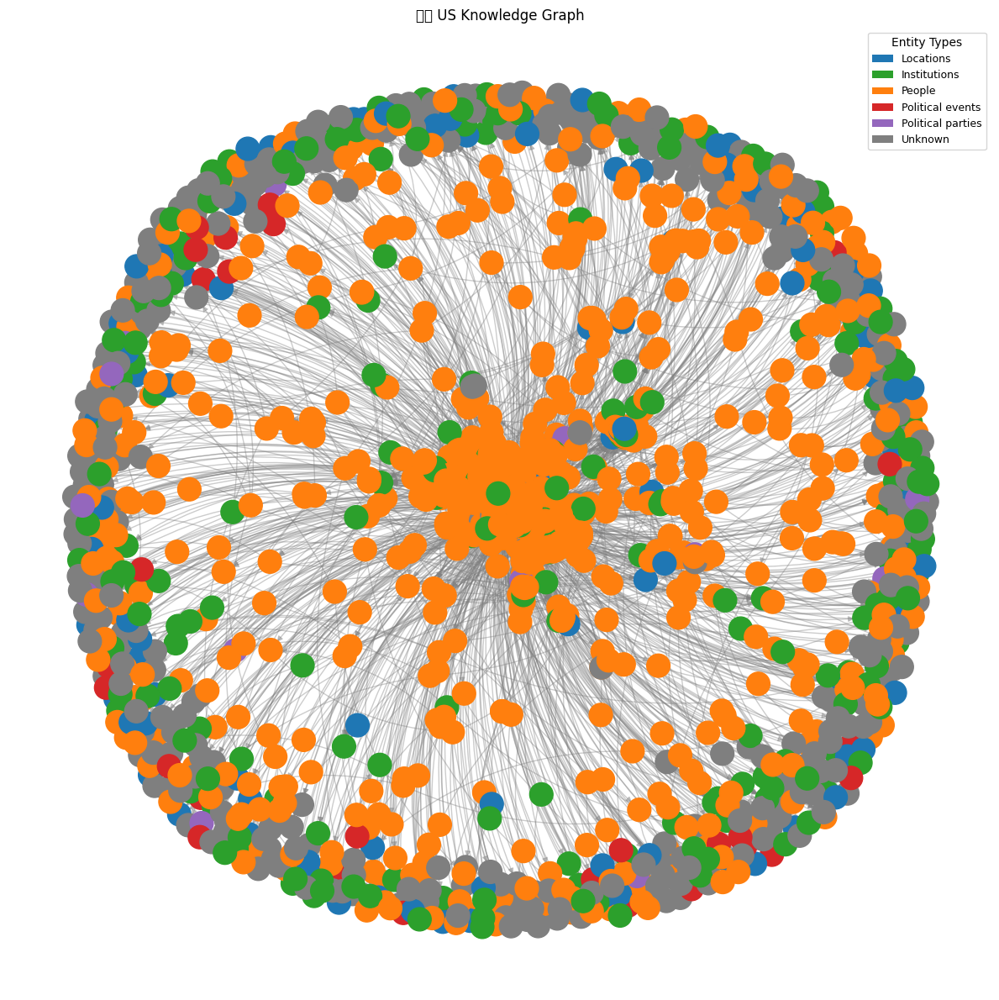

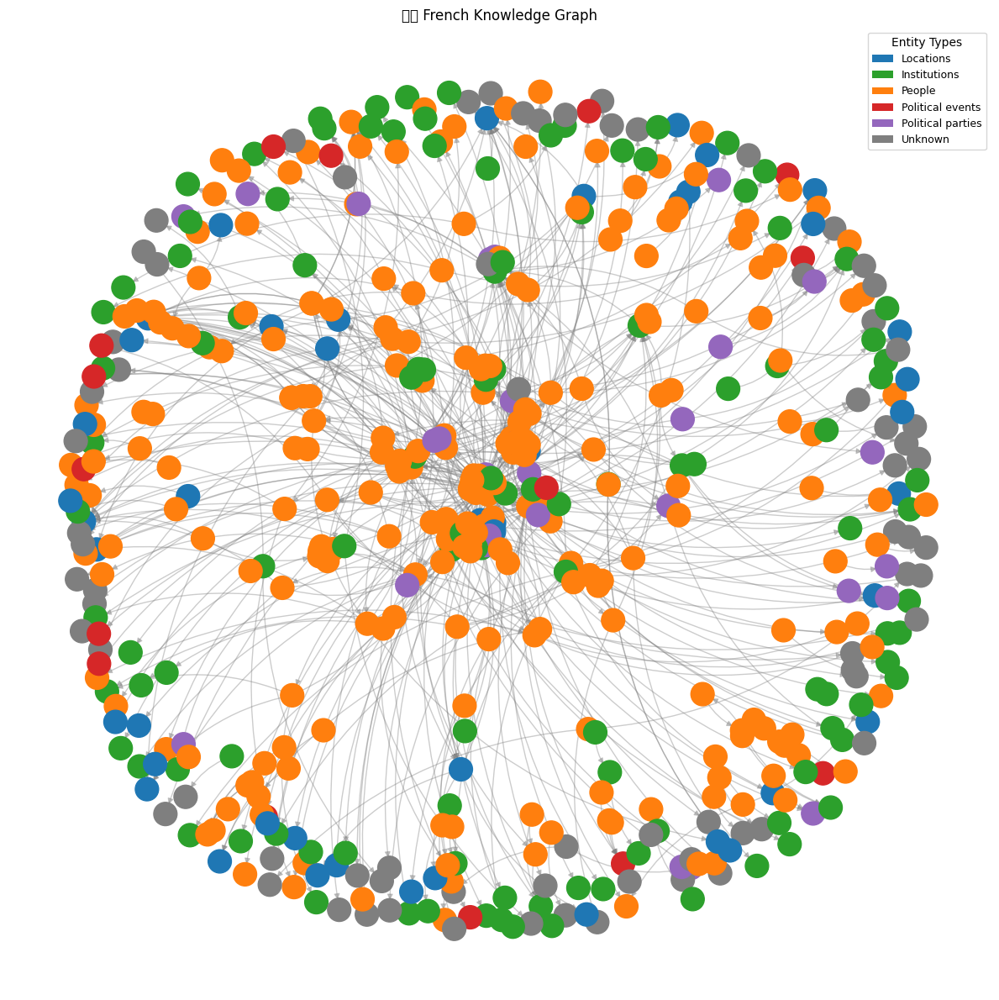

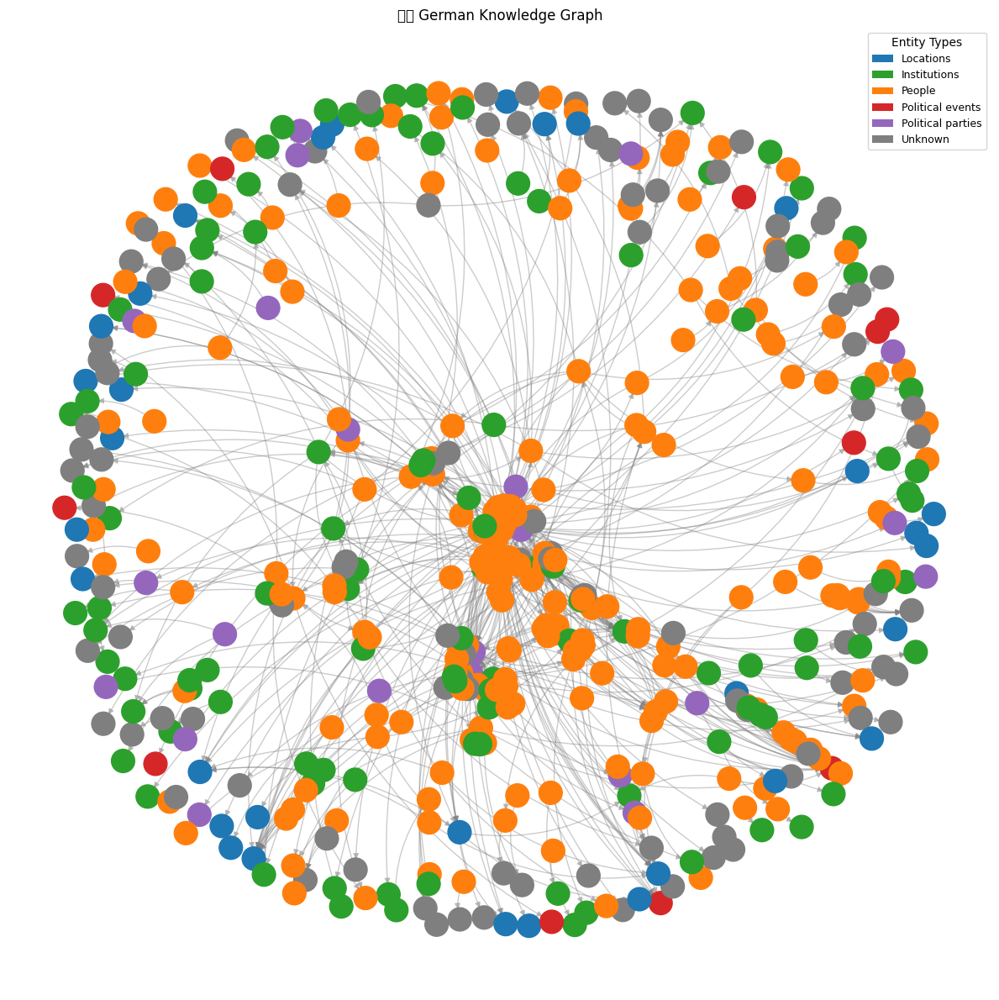

In [47]:
visualize_graph(G_us, "🇺🇸 US Knowledge Graph")
visualize_graph(G_french, "🇫🇷 French Knowledge Graph")
visualize_graph(G_german, "🇩🇪 German Knowledge Graph")

In [48]:
edges_df.article_source.value_counts()

article_source
us        4254
german     798
french     762
Name: count, dtype: int64

## Knowledge Graph Coverage by Country

The knowledge graphs for the United States, France, and Germany reflect differences in coverage that stem from the number of extracted edges (entity relationships) sourced from news articles:

**- United States**
The U.S. graph contains approximately 4,200 edges, making it the most densely connected of the three. It features a high volume of entities and relationships, leading to a more complex and clustered graph structure.

**- France**
The French graph contains approximately 750 edges. It is moderately dense, showing a visible structure with some well-formed clusters, but less overall connectivity than the U.S.

**- Germany**
The German graph also contains roughly 750 edges, but appears sparser in comparison. It includes fewer relationships and more disconnected or weakly connected components.

>These variations reflect the differing volume of articles and entities extracted per country. All subsequent analyses will take these differences in scale and coverage into account.

# graph metrics 

In [62]:
def compute_graph_metrics(G):
    import networkx as nx

    num_nodes = G.number_of_nodes()
    num_edges = G.number_of_edges()
    num_articles = len(set(nx.get_edge_attributes(G, "source_url").values()))
    avg_degree = round(sum(dict(G.degree()).values()) / num_nodes, 2) if num_nodes > 0 else 0
    density = round(nx.density(G), 4)

    # Component counts
    wcc_count = nx.number_weakly_connected_components(G)
    scc_count = nx.number_strongly_connected_components(G)

    return {
        "Number of nodes": num_nodes,
        "Number of edges": num_edges,
        "Number of articles": num_articles,
        "Average degree": avg_degree,
        "Graph density": density,
        "Weakly connected components": wcc_count,
        "Strongly connected components": scc_count
    }

In [64]:
metrics = {
    "US": compute_graph_metrics(G_us),
    "France": compute_graph_metrics(G_french),
    "Germany": compute_graph_metrics(G_german)
}
df_metrics = pd.DataFrame(metrics)
df_metrics

,US,France,Germany
Number of nodes,1679.0000,532.0000,495.0000
Number of edges,2527.0000,675.0000,630.0000
Number of articles,474.0000,202.0000,163.0000
Average degree,3.0100,2.5400,2.5500
Graph density,0.0009,0.0024,0.0026
Weakly connected components,80.0000,44.0000,58.0000
Strongly connected components,1470.0000,478.0000,461.0000


### **Number of Nodes and Edges**

The U.S. graph has 1,679 nodes and 2,527 edges, while the French and German graphs are much smaller in comparison. This reflects the larger volume of extracted content from U.S. sources, which results in a wider set of entities and relationships. The higher number of edges also means that the U.S. graph has more documented interactions between entities.

### **Graph Density**

Graph density refers to how many actual edges exist in the graph compared to the total number of possible edges. The U.S. graph, despite having the most edges, has the lowest density (0.0009), because the large number of nodes makes full interconnection less likely. This suggests that while the U.S. graph is richer in data, it’s more spread out and less tightly connected.

### **Average Degree**

The average degree tells us how many connections each entity has on average. It’s slightly higher in the U.S. (3.01) than in France (2.54) or Germany (2.55), meaning U.S. entities tend to be involved in more relationships. Overall though, the similarity in values suggests comparable levels of local connectedness across the graphs.

### **Weakly Connected Components**

Weakly connected components are parts of the graph where entities are linked, regardless of edge direction. The U.S. graph has 80 of these, compared to 44 in France and 58 in Germany, indicating that it is more fragmented. This fragmentation may reflect the broader scope of topics and actors in U.S. media coverage.

### **Strongly Connected Components**

A strongly connected component means every node can reach every other node by following the direction of the edges. The U.S. graph has 1,470 such components, much more than France (478) and Germany (461). This again shows high fragmentation, suggesting that relationships tend to flow in one direction and form small, closed loops.

# Centrality metrics 
	•	Betweenness centrality: Who acts as a broker or bridge?
	•	Eigenvector centrality: Who is influential by association?
	•	PageRank: Who is important based on recursive connectivity?

Each metric gives a different view of importance. We’ll compute them for each graph and prepare them for both within-graph ranking and cross-country comparison.

In [66]:
def compute_centrality_metrics(G):
    import networkx as nx
    return {
        "betweenness": nx.betweenness_centrality(G),
        "eigenvector": nx.eigenvector_centrality(G, max_iter=1000),
        "pagerank": nx.pagerank(G)
    }
    
def centrality_df(country, centrality_dict):
    df = pd.DataFrame({
        "entity": list(centrality_dict["pagerank"].keys()),
        "pagerank": list(centrality_dict["pagerank"].values()),
        "betweenness": list(centrality_dict["betweenness"].values()),
        "eigenvector": list(centrality_dict["eigenvector"].values()),
    })
    df["country"] = country
    return df.sort_values(by="pagerank", ascending=False).reset_index(drop=True)    

In [68]:
centralities = {
    "US": compute_centrality_metrics(G_us),
    "France": compute_centrality_metrics(G_french),
    "Germany": compute_centrality_metrics(G_german)
}

df_us_centrality = centrality_df("US", centralities["US"])
df_fr_centrality = centrality_df("France", centralities["France"])
df_de_centrality = centrality_df("Germany", centralities["Germany"])

df_all_centrality = pd.concat([df_us_centrality, df_fr_centrality, df_de_centrality])

In [70]:
df_all_centrality.head(10)

,entity,pagerank,betweenness,eigenvector,country
0,Donald Trump,0.089247,0.168644,0.384201,US
1,Kamala Harris,0.023837,0.035101,0.146472,US
2,Russia,0.010526,0.004409,0.070174,US
3,United States,0.009699,0.009319,0.103373,US
4,Democratic Party,0.008822,0.009736,0.088140,US
5,Ukraine,0.008373,0.001486,0.131459,US
6,Republican Party,0.006881,0.010519,0.090972,US
7,Joe Biden,0.005419,0.009474,0.114595,US
8,China,0.004943,0.007941,0.090432,US
9,Europe,0.003768,0.000000,0.065206,US


In [73]:
df_fr_centrality.head(10)

,entity,pagerank,betweenness,eigenvector,country
0,France,0.025631,0.027310,0.270759,France
1,Ukraine,0.018491,0.000000,0.393877,France
2,Emmanuel Macron,0.017450,0.050933,0.166789,France
3,Jean-Marie Le Pen,0.016485,0.049973,0.222691,France
4,gouvernement,0.011572,0.003020,0.139256,France
5,Francois Bayrou,0.009926,0.040356,0.172472,France
6,Syria,0.009442,0.000000,0.074185,France
7,Russia,0.009356,0.000000,0.223923,France
8,China,0.008827,0.000253,0.116762,France
9,Donald Trump,0.008279,0.017915,0.169860,France


In [74]:
df_de_centrality.head(10)

,entity,pagerank,betweenness,eigenvector,country
0,SPD,0.023360,0.025693,0.348978,Germany
1,Koalitionsvertrag,0.023018,0.000000,0.263379,Germany
2,AfD,0.018840,0.024825,0.170340,Germany
3,Friedrich Merz,0.016496,0.038395,0.187755,Germany
4,Deutschland,0.014586,0.000000,0.319214,Germany
5,Bundesregierung,0.014200,0.001709,0.041730,Germany
6,CDU,0.014177,0.018024,0.260538,Germany
7,Russland,0.012756,0.000000,0.089907,Germany
8,Union,0.009886,0.006308,0.203369,Germany
9,Merz,0.009419,0.006706,0.122981,Germany


### **Centrality Insights: United States**

Donald Trump clearly dominates the U.S. graph with the highest PageRank (0.089), betweenness, and eigenvector scores. He appears to be the most central political figure across all metrics, which is consistent with his media presence and polarizing role in U.S. politics. Other top-ranked entities include Kamala Harris, Russia, the United States (as a country node), and the Democratic and Republican parties — showing that the U.S. graph blends both individual actors and institutional forces.

### **Centrality Insights: France**

In the French graph, the most central entity is France itself, followed by Ukraine and Emmanuel Macron. Interestingly, Emmanuel Macron has high betweenness and PageRank, while Jean-Marie Le Pen and Francois Bayrou also rank high, indicating a diversity of political voices. The appearance of foreign countries like Russia and China also shows how French discourse is intertwined with international topics.

### **Centrality Insights: Germany**

In the German graph, political parties like SPD, AfD, CDU, and Union dominate the top spots, with high PageRank and eigenvector centrality. SPD leads in overall importance, while Friedrich Merz shows up with relatively high betweenness, signaling a potential bridging role in the graph. Governmental terms like "Bundesregierung" and "Koalitionsvertrag" also appear frequently, reflecting the institutional nature of German political reporting.

### **Cross-Country Comparison**

Across all three graphs, the top central entities reflect both the political structure and media focus of each country. The U.S. graph is dominated by individual political figures and party nodes, while the French graph has a blend of domestic and international topics. The German graph leans more toward political parties and official institutions. Due to the larger number of articles and relationships in the U.S. graph, centrality values are naturally more spread out and intense — making **ranking comparisons more meaningful than raw scores**.

# normalizing scores 

In [75]:
def normalize_scores(df, columns):
    df_norm = df.copy()
    for col in columns:
        min_val = df[col].min()
        max_val = df[col].max()
        df_norm[f"{col}_norm"] = (df[col] - min_val) / (max_val - min_val) if max_val != min_val else 0
    return df_norm

In [79]:
df_us_centrality = normalize_scores(df_us_centrality, ["pagerank", "betweenness", "eigenvector"])
df_fr_centrality = normalize_scores(df_fr_centrality, ["pagerank", "betweenness", "eigenvector"])
df_de_centrality = normalize_scores(df_de_centrality, ["pagerank", "betweenness", "eigenvector"])

In [80]:
df_top_us = df_us_centrality.nlargest(5, "pagerank_norm")
df_top_fr = df_fr_centrality.nlargest(5, "pagerank_norm")
df_top_de = df_de_centrality.nlargest(5, "pagerank_norm")

df_top_all = pd.concat([df_top_us, df_top_fr, df_top_de])

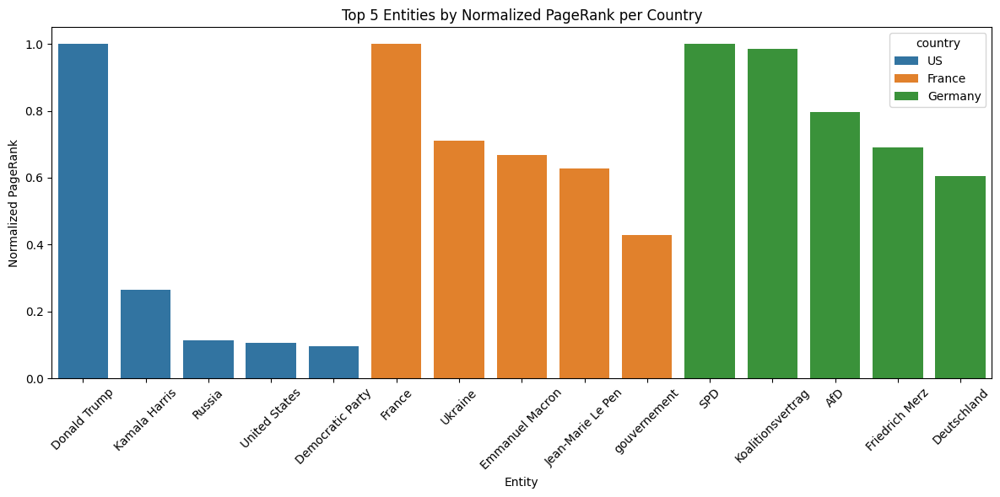

In [81]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.barplot(data=df_top_all, x="entity", y="pagerank_norm", hue="country")

plt.title("Top 5 Entities by Normalized PageRank per Country")
plt.ylabel("Normalized PageRank")
plt.xlabel("Entity")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### **Normalized PageRank: Interpretation from a Campaign Strategy Perspective**

This visualization shows the top 5 entities in each national graph by their normalized PageRank — a measure of influence based on network structure. 

In the **U.S. graph**, Donald Trump dominates dramatically, with a normalized score of 1.0, while the rest of the top entities (Kamala Harris, Russia, Democratic Party) have much lower scores. This steep drop-off suggests that the political media landscape in the U.S. is heavily centralized around one or two figures, making it a high-risk, high-reward environment for political messaging. Campaign managers might focus on aligning or contrasting with dominant figures to maximize visibility, but also need to be cautious of the volatility such concentration can bring.

In contrast, **France and Germany** show much more balanced distributions. France’s top influencers include not just the country itself and Macron, but also Ukraine and Jean-Marie Le Pen — indicating a discourse that blends domestic and international topics. Germany’s graph is similarly even, with political parties (SPD, CDU, AfD) and institutional entities (Koalitionsvertrag, Bundesregierung) all scoring closely. For campaign managers in these countries, this suggests a more distributed influence structure, where targeting multiple entities or narratives might be more effective than focusing on a single dominant voice.

Across all three graphs, the shape of influence reflects different media and political dynamics. The U.S. network favors visibility via major personalities, while France and Germany offer more room for coalition-based or multi-stakeholder strategies.

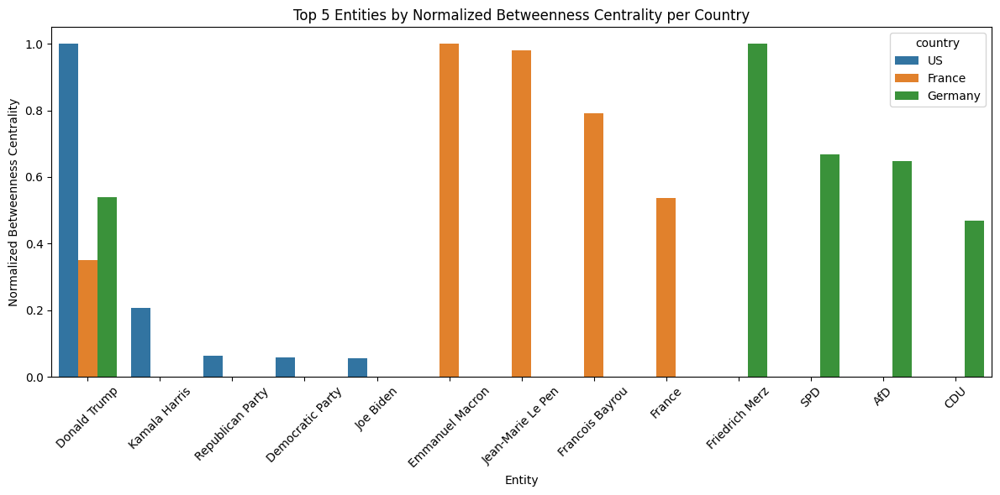

In [84]:
# Combine top 5 betweenness scores per country
df_top_betweenness = pd.concat([
    df_us_centrality.nlargest(5, "betweenness_norm"),
    df_fr_centrality.nlargest(5, "betweenness_norm"),
    df_de_centrality.nlargest(5, "betweenness_norm")
])

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(data=df_top_betweenness, x="entity", y="betweenness_norm", hue="country")
plt.title("Top 5 Entities by Normalized Betweenness Centrality per Country")
plt.ylabel("Normalized Betweenness Centrality")
plt.xlabel("Entity")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### **Betweenness Centrality: Interpretation**

In the U.S. graph, Donald Trump has an extremely high betweenness score compared to others, highlighting his role as a critical connector or bridge between different parts of the network. France shows a more balanced distribution, with Emmanuel Macron, Jean-Marie Le Pen, and François Bayrou all acting as central intermediaries in political discourse. In Germany, Friedrich Merz and party entities like SPD and AfD have strong bridging roles, suggesting they occupy key structural positions that connect otherwise separate parts of the political narrative.

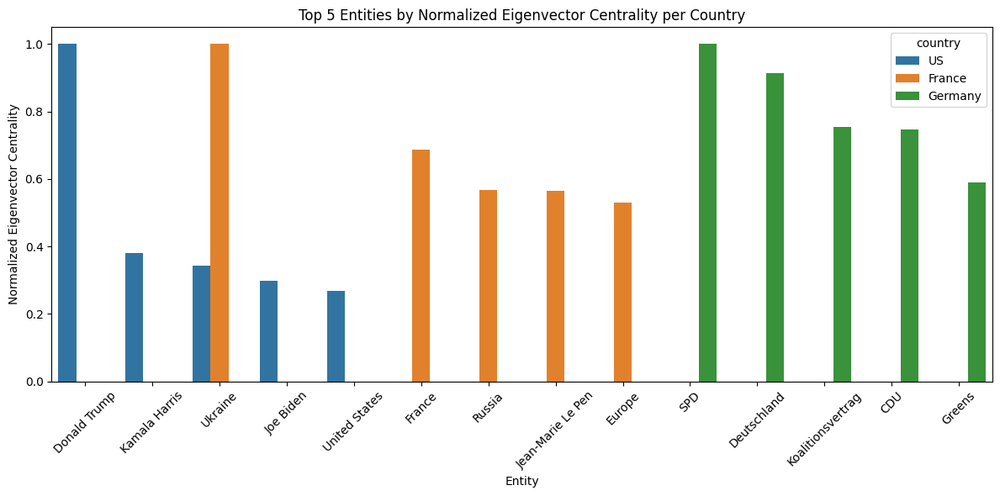

In [85]:
# Combine top 5 eigenvector scores per country
df_top_eigenvector = pd.concat([
    df_us_centrality.nlargest(5, "eigenvector_norm"),
    df_fr_centrality.nlargest(5, "eigenvector_norm"),
    df_de_centrality.nlargest(5, "eigenvector_norm")
])

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(data=df_top_eigenvector, x="entity", y="eigenvector_norm", hue="country")
plt.title("Top 5 Entities by Normalized Eigenvector Centrality per Country")
plt.ylabel("Normalized Eigenvector Centrality")
plt.xlabel("Entity")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### **Eigenvector Centrality: Interpretation**

Donald Trump again stands out in the U.S. graph with the highest eigenvector centrality, meaning he is not only central but also connected to other well-connected entities. France’s top entity is Ukraine, which reflects the prominence of international affairs in the media, followed closely by domestic figures like Macron and Le Pen. The German graph is dominated by political parties and institutions, with SPD, Deutschland, and CDU scoring highest — this suggests that influence in the German context is more institutionally rooted rather than personality-driven.

### **Summary: Centrality Patterns Across Countries**

Across all three centrality metrics, the U.S. graph is highly concentrated around individual political figures — especially Donald Trump — who dominates not just in PageRank and eigenvector centrality, but also as a structural bridge in the network. This highlights the personality-driven nature of U.S. political discourse and the role of major figures as single points of attention and influence.

In contrast, the French and German graphs are more evenly distributed. France features a mix of domestic leaders and international actors like Ukraine and Russia, indicating a media landscape that blends national and global concerns. Germany is distinctly institution-heavy, with political parties and governmental entities holding central positions across all metrics, suggesting that influence flows through formal structures more than through singular personalities.

These patterns have clear strategic implications: U.S. campaign messaging may benefit from targeting or responding to a few dominant figures, while campaigns in France and Germany may need a more diversified or coalition-oriented communication strategy.

# Community detection

In [87]:
import community as community_louvain

def detect_communities_louvain(G):
    partition = community_louvain.best_partition(G.to_undirected())
    nx.set_node_attributes(G, partition, "community")
    return partition

In [88]:
partition_us = detect_communities_louvain(G_us)
partition_fr = detect_communities_louvain(G_french)
partition_de = detect_communities_louvain(G_german)

In [95]:
def plot_community_graph(G, title, centrality_dict=None, label_top_n=10):
    import matplotlib.pyplot as plt
    import networkx as nx

    pos = nx.spring_layout(G, seed=42)

    # Community coloring
    communities = nx.get_node_attributes(G, "community")
    unique_communities = list(set(communities.values()))
    color_map = {comm: plt.cm.tab20(i % 20) for i, comm in enumerate(unique_communities)}
    node_colors = [color_map[communities.get(n, -1)] for n in G.nodes()]

    # Top N nodes by centrality (optional labels)
    top_node_labels = {}
    if centrality_dict:
        top_nodes_sorted = sorted(centrality_dict.items(), key=lambda x: x[1], reverse=True)
        top_nodes = [node for node, _ in top_nodes_sorted[:label_top_n]]
        top_node_labels = {node: node for node in G.nodes() if node in top_nodes}

    # Draw
    plt.figure(figsize=(12, 12))
    nx.draw_networkx_nodes(G, pos, node_size=300, node_color=node_colors, alpha=0.8)
    nx.draw_networkx_edges(G, pos, alpha=0.1)
    nx.draw_networkx_labels(G, pos, labels=top_node_labels, font_size=9, font_color="black")
    plt.title(title)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

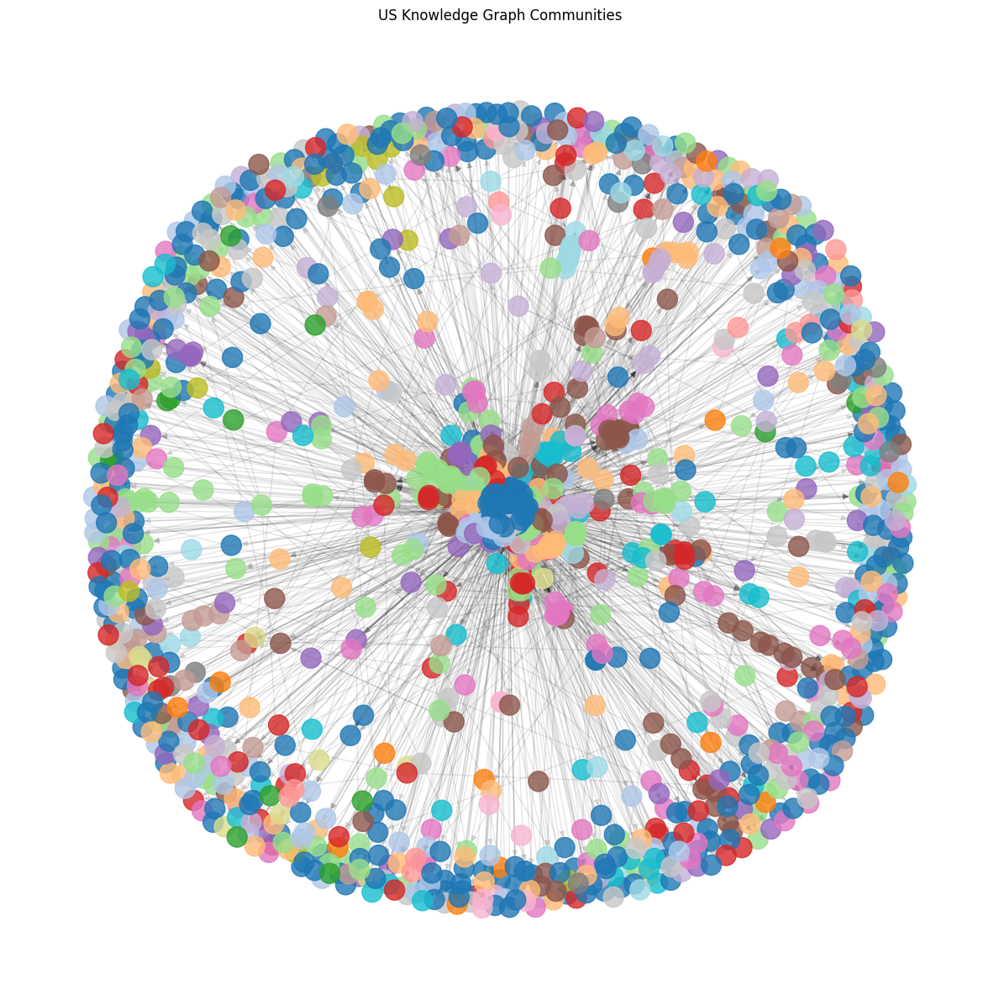

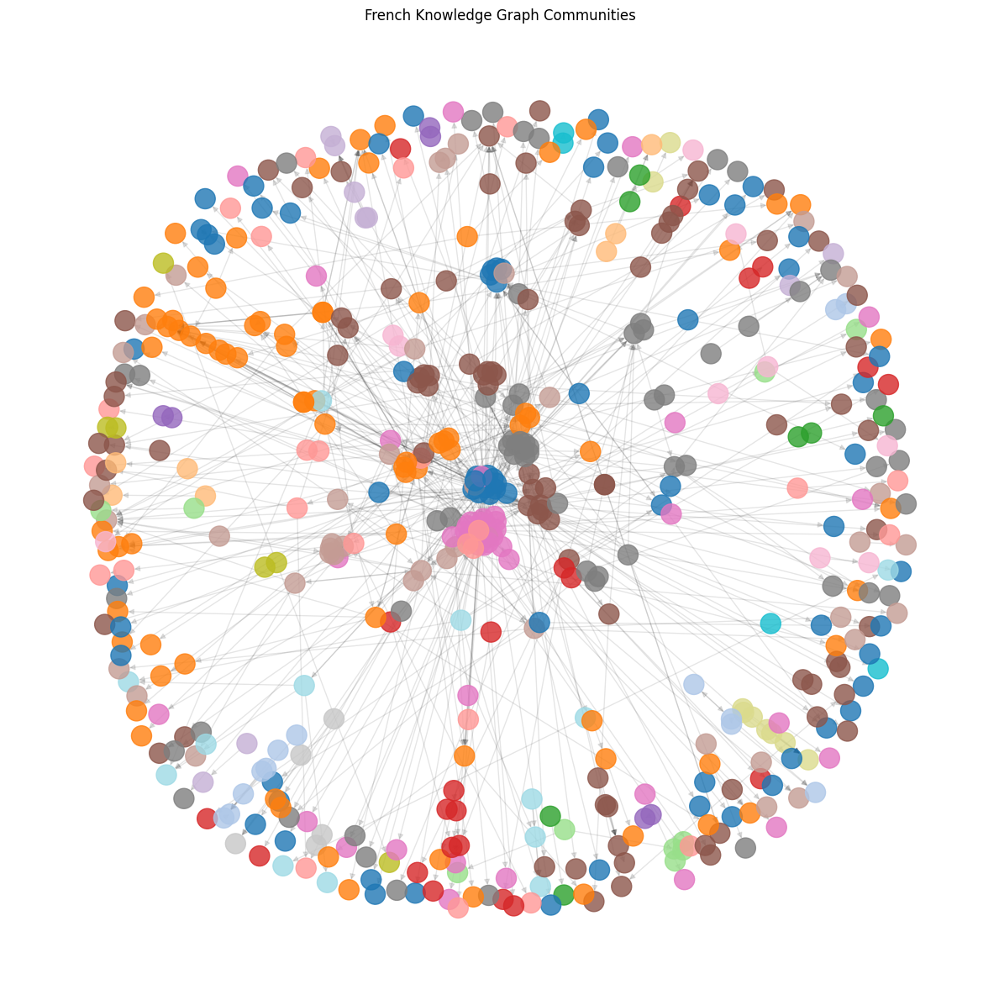

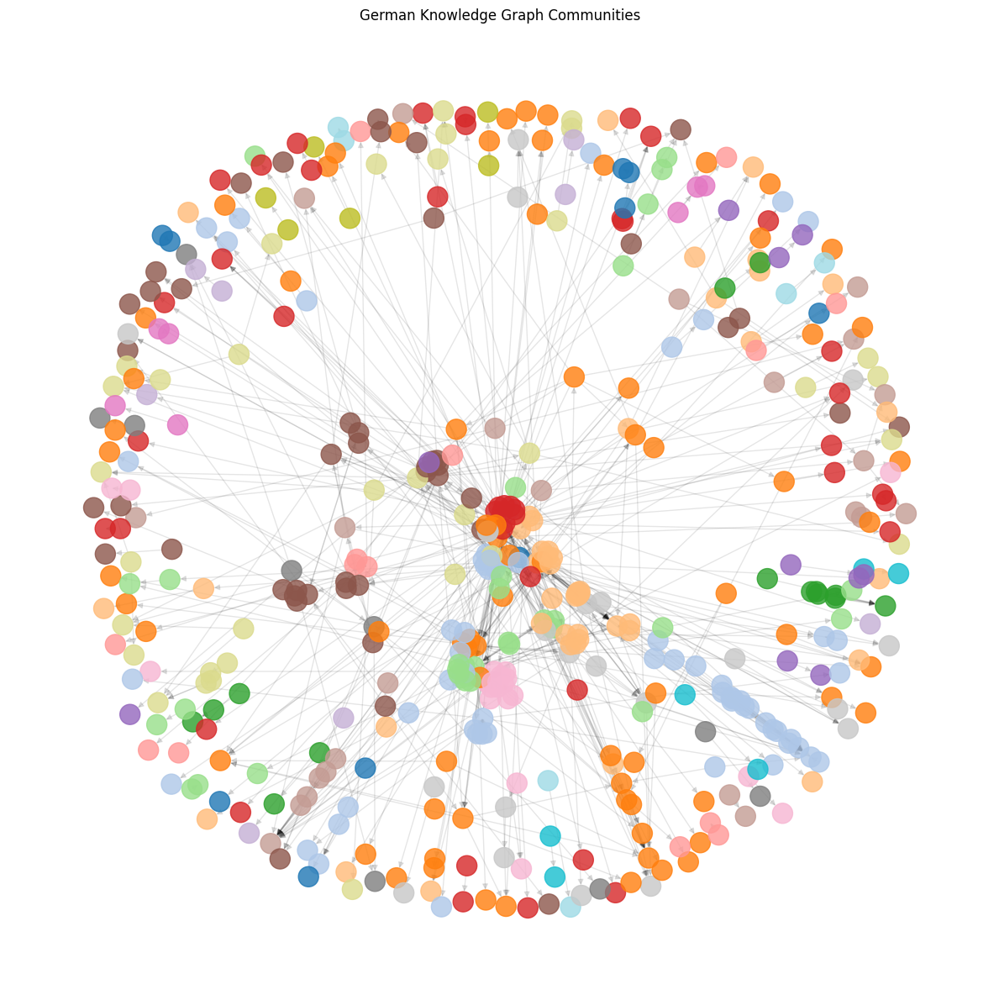

In [96]:
plot_community_graph(G_us, "US Knowledge Graph Communities")
plot_community_graph(G_french, "French Knowledge Graph Communities")
plot_community_graph(G_german, "German Knowledge Graph Communities")

## Top entities per community 

In [91]:
def top_entities_by_community(G, centrality_scores, top_n=3):
    df = pd.DataFrame({
        "entity": list(centrality_scores.keys()),
        "score": list(centrality_scores.values()),
        "community": [G.nodes[n].get("community", -1) for n in centrality_scores.keys()]
    })
    return df.groupby("community").apply(lambda x: x.nlargest(top_n, "score")).reset_index(drop=True)

In [110]:
top_us_by_comm = top_entities_by_community(G_us, centralities["US"]["pagerank"])
top_fr_by_comm = top_entities_by_community(G_french, centralities["France"]["pagerank"])
top_de_by_comm = top_entities_by_community(G_german, centralities["Germany"]["pagerank"])
df_top_all = pd.concat([top_us_by_comm, top_fr_by_comm, top_de_by_comm], ignore_index=True)
df_top_all

,entity,score,community
0,Donald Trump,0.089247,0
1,Interior Department,0.001282,0
2,South Africa’s apartheid government,0.001012,0
3,Kamala Harris,0.023837,1
4,Inflation Reduction Act,0.002103,1
...,...,...,...
551,Germany’s election,0.001557,68
552,social media platforms,0.001557,68
553,Interior Ministry,0.001093,68
554,misleading narratives,0.002022,69


In [118]:
def summarize_top_communities_v2(G, centrality_dict, country, top_n=5):
    import pandas as pd
    from collections import Counter

    communities = nx.get_node_attributes(G, "community")
    edges = G.in_edges(data=True)  # use in_edges for incoming relationships

    # Get top N communities by size
    community_sizes = Counter(communities.values())
    top_communities = [comm for comm, _ in community_sizes.most_common(top_n)]

    summary = []

    for comm in top_communities:
        nodes_in_comm = [n for n, c in communities.items() if c == comm]
        subgraph = G.subgraph(nodes_in_comm)

        # Leader by PageRank
        central_nodes = {n: centrality_dict[n] for n in nodes_in_comm if n in centrality_dict}
        leader = max(central_nodes.items(), key=lambda x: x[1])[0] if central_nodes else "N/A"

        # Internal incoming edges
        internal_incoming_edges = [(u, v, d) for u, v, d in edges if v in nodes_in_comm and u in nodes_in_comm]
        external_incoming_edges = [(u, v, d) for u, v, d in G.in_edges(data=True) if u not in nodes_in_comm and v in nodes_in_comm]
        rels_i = [d.get("relationship") for _, _, d in internal_incoming_edges]
        rels_e = [d.get("relationship") for _, _, d in external_incoming_edges]


        sentiment_score_map = {"hostile": -1, "neutral": 0, "friendly": 1}
        normalized_internal_sentiments = [d.get("sentiment", "").strip().lower() for _, _, d in internal_incoming_edges]
        avg_internal_sentiment = (
            sum(sentiment_score_map.get(s, 0) for s in normalized_internal_sentiments) / len(normalized_internal_sentiments)
            if normalized_internal_sentiments else None
        )
        friendly_internal_count = sum(1 for s in normalized_internal_sentiments if s == "friendly")
        friendly_internal_pct = round((friendly_internal_count / len(normalized_internal_sentiments)) * 100, 1) if normalized_internal_sentiments else 0
        # External sentiment scores
        normalized_external_sentiments = [
            d.get("sentiment", "").strip().lower() for _, _, d in external_incoming_edges
        ]
        avg_external_sentiment = (
            sum(sentiment_score_map.get(s, 0) for s in normalized_external_sentiments) / len(normalized_external_sentiments)
            if normalized_external_sentiments else None
        )
        friendly_external_count = sum(1 for s in normalized_external_sentiments if s == "friendly")
        friendly_external_pct = round((friendly_external_count / len(normalized_external_sentiments)) * 100, 1) if normalized_external_sentiments else 0

        summary.append({
            "country": country,
            "community_id": comm,
            "size": len(nodes_in_comm),
            "leader": leader,
            "most_frequent_incoming_internal_relationship": (
                f"{rel} ({count})" if rels_i else "N/A"
                for rel, count in Counter(rels_i).most_common(1)
            ).__next__(),
            "most_frequent_incoming_external_relationship": (
                f"{rel} ({count})" if rels_e else "N/A"
                for rel, count in Counter(rels_e).most_common(1)
            ).__next__(),
            "average_internal_sentiment_score": round(avg_internal_sentiment, 2) if avg_internal_sentiment is not None else "N/A",
            "percent_friendly_internal": friendly_internal_pct,
            "average_external_sentiment_score": round(avg_external_sentiment, 2) if avg_external_sentiment is not None else "N/A",
            "percent_friendly_external": friendly_external_pct
        })

    return pd.DataFrame(summary)

In [120]:
df_summary_us = summarize_top_communities_v2(G_us, centralities["US"]["pagerank"], "US")
df_summary_fr = summarize_top_communities_v2(G_french, centralities["France"]["pagerank"], "France")
df_summary_de = summarize_top_communities_v2(G_german, centralities["Germany"]["pagerank"], "Germany")

df_communities_all = pd.concat([df_summary_us, df_summary_fr, df_summary_de], ignore_index=True)

In [121]:
df_communities_all

,country,community_id,size,leader,most_frequent_incoming_internal_relationship,most_frequent_incoming_external_relationship,average_internal_sentiment_score,percent_friendly_internal,average_external_sentiment_score,percent_friendly_external
0,US,0,451,Donald Trump,supports (171),supports (61),-0.22,14.2,-0.21,17.0
1,US,1,157,Kamala Harris,supports (87),supports (25),0.12,28.8,-0.18,16.9
2,US,3,131,Democratic Party,supports (56),supports (28),-0.10,12.7,-0.13,16.7
3,US,10,99,United States,opposes (37),supports (16),-0.27,12.5,-0.25,16.4
4,US,5,92,Russia,criticizes (28),opposes (19),-0.36,8.7,-0.26,12.1
5,France,2,73,Ukraine,supports (33),supports (16),-0.29,7.8,0.00,23.3
6,France,14,55,Jean-Marie Le Pen,supports (16),opposes (5),-0.31,4.7,-0.27,20.0
7,France,30,52,Francois Bayrou,supports (18),supports (4),-0.20,5.4,-0.31,0.0
8,France,0,48,Emmanuel Macron,criticizes (13),criticizes (11),-0.20,9.8,-0.73,0.0
9,France,12,43,France,partners with (10),represents (3),-0.23,0.0,-0.23,0.0


### **Internal vs. External Sentiment: Key Takeaways**

- Most communities exhibit **aligned internal and external sentiment** — those with internal negativity tend to also be viewed negatively from the outside.
- Across the board, **external sentiment is generally more hostile** than internal sentiment, and **friendliness levels drop** significantly when moving from internal to external perception.
- “**Supports**” is the most common incoming relationship even in many negatively perceived communities, hinting at internal alliance networks that still operate under broader tension.
- These patterns reflect a media and political landscape where **alignment does not equal harmony**, and support can coexist with critical tone.

### **Notable Exceptions and Interpretive Cases**

- **Kamala Harris’s community** shows a **positive internal tone (+0.12)** and **very high friendliness (28.8%)**, but a **notably more negative and less friendly** perception from outside. This could reflect an **echo chamber effect**, where internal members reinforce positive views, while the external environment critiques or doubts that same group — a pattern often observed in polarized media ecosystems.

- **Ukraine’s community** receives support both internally and externally, yet the **external sentiment is surprisingly neutral (0.00)** despite a **high friendliness rate (23.3%)**. One possible interpretation is **geopolitical strategic ambiguity**: external actors may support Ukraine in action or relationship but **soften their tone to avoid antagonizing other powers**, especially Russia.

- **Koalitionsvertrag (Germany)** is **criticized internally but supported externally**, with a **positive external sentiment (+0.16)**. This may reflect a **disconnect between political insiders and external observers**. Internally, coalition agreements may be controversial or seen as weak compromises, while to outsiders they can represent stability or governance progress. It could also signal a **lack of detailed understanding** from outside actors — supporting the idea of something they don't deeply evaluate.

- **Friedrich Merz’s community** is an example of **internal alignment and friendliness (26.3%)** met with **external criticism and low friendliness (6.2%)**. This could suggest that while his base is cohesive, the broader media or political landscape remains skeptical or opposed — a classic dynamic in **strong but polarizing political figures**.

- **Emmanuel Macron’s cluster** reflects a well-documented real-world pattern: **centrist leadership often draws criticism from multiple sides**, especially externally. With **external sentiment significantly harsher (–0.73)** than internal (–0.20), Macron’s community may symbolize how moderation doesn’t shield a figure from intensified scrutiny across ideological divides.

### **Summary of Top Political Communities Across Countries**

The largest and most central community in the dataset is led by Donald Trump, with over 450 entities in the U.S. graph. Internally, the dominant relationship is "supports" (171 instances), but externally the community also receives significant support (61 incoming relationships from outside). Despite this, the average sentiment remains negative (-0.22) and only 14.2% of the internal interactions are friendly — indicating a cluster that is both internally polarized and externally contested, possibly reflecting Trump's polarizing media presence.

The Kamala Harris–led community is smaller but markedly more positive. Internally and externally, "supports" is also the most common relationship, and it holds the highest friendliness percentage (28.8%) among U.S. clusters, along with a positive sentiment score (+0.12). This suggests a relatively cohesive and favorable media environment, both within the cluster and from outsiders.

Other U.S. communities — such as those led by the Democratic Party, the United States, and Russia — show dominant relationships like "supports", "opposes", and "criticizes", yet all fall below neutral sentiment. These clusters exhibit some internal coherence but are often the target of criticism or mixed messaging from external sources.

In France, the communities led by Ukraine, Jean-Marie Le Pen, François Bayrou, and Emmanuel Macron all have negative sentiment scores and low friendliness levels. Internal relationships are still mostly positive in form ("supports"), but several receive critical or oppositional messaging from outside (e.g., Le Pen’s cluster receives "opposes" externally). Macron’s community reflects his centrist role — drawing both internal criticism and external relevance, with sentiment slightly less negative than his peers.

German communities are centered on institutions like SPD, Koalitionsvertrag, and the European Parliament. Most exhibit internal criticism as the dominant relationship type, but external relationships vary: some receive support, while others like CDU or Friedrich Merz attract "criticizes" externally. The European Parliament and Merz clusters show relatively high friendliness (22.6% and 26.3%) and near-neutral sentiment, pointing to broader institutional or pan-European appeal.

Temporally, most clusters show activity spanning several months into 2025, particularly in France and Germany. This sustained attention may reflect long-term narrative relevance or stable coverage patterns.

Overall, these community structures highlight key national differences: U.S. clusters are personality-driven and intensely polarized both inside and out. French clusters reflect international entanglements and ideological fragmentation. German clusters are more institutionally grounded, with clearer boundaries between internal cohesion and external discourse. The contrast between internal and external incoming relationships offers valuable insight into not only what groups say about themselves, but also how they are perceived — and targeted — by others.

In [123]:
import pandas as pd

def compute_inter_community_stats(G, country, partition):
    # Count edges where source and target belong to different communities
    inter_edges = sum(1 for u, v in G.edges() if partition.get(u) != partition.get(v))
    total_edges = G.number_of_edges()
    ratio = round(inter_edges / total_edges, 4) if total_edges > 0 else 0

    return {
        "Country": country,
        "Inter-community edges": inter_edges,
        "Total edges": total_edges,
        "Inter-community edge ratio": ratio
    }

# Apply to your three real graphs and partitions
stats_us = compute_inter_community_stats(G_us, "US", partition_us)
stats_fr = compute_inter_community_stats(G_french, "France", partition_fr)
stats_de = compute_inter_community_stats(G_german, "Germany", partition_de)

# Create transposed DataFrame
df_inter_community = pd.DataFrame([stats_us, stats_fr, stats_de]).set_index("Country").T
df_inter_community

Country,US,France,Germany
Inter-community edges,728.0000,123.0000,153.0000
Total edges,2527.0000,675.0000,630.0000
Inter-community edge ratio,0.2881,0.1822,0.2429


### **Inter-Community Connectivity Summary**

The U.S. graph exhibits the highest inter-community edge ratio (28.8%), suggesting greater overlap and interaction between different clusters — possibly reflecting a more entangled or contested media landscape. France shows the lowest ratio (18.2%), indicating more siloed communities with fewer cross-cluster links. Germany sits in the middle (24.3%), suggesting a moderately connected political discourse where communities interact but retain some boundaries.

### **Wrap-Up: What We've Learned from the Graph**

The network analysis provides a detailed picture of the media and political landscape across the U.S., France, and Germany. By examining node-level centrality, structural patterns, and community-level sentiment, we've identified not just who the key actors are, but how they relate to each other both internally and externally. The addition of internal versus external sentiment and relationship analysis revealed how communities are perceived beyond their own circles, offering insight into both cohesion and contested narratives.

At this point, the graph tells a full story: it's structured, layered, and comparative. Moving forward, the focus shifts toward the article classifier. The next phase will involve improving the classifier's performance, conducting error analysis, and understanding what types of articles it tends to flag as election-relevant. Finally, we'll revisit the graph by reconstructing it using only classifier-labeled articles, enabling a direct comparison between how the LLM and our model interpret the political information landscape.

### **Limitations and Future Exploration**

- **Country-based filtering creates blind spots**: Because each graph is built from articles published in a specific country, we may miss relationships involving foreign actors. For example, an interaction between Trump and Macron might appear in the U.S. graph but not in the French one, even though both are involved. This limits the global completeness of each national graph.

- **Static community snapshot**: Our community analysis is based on the current graph structure and does not track **when** entities joined a community or whether clusters have **shifted over time**. Exploring the **temporal dynamics** of community formation — such as detecting "new arrivals" into clusters or spikes in connections — could offer further insight into evolving media narratives.

- **Possibility of focused case studies**: If time allows, a deeper investigation into a specific community — such as Kamala Harris's — could be revealing. We could examine which entities consistently appear in her cluster, what types of actors they are (e.g. individuals, institutions, media), and how sentiment and relationships vary within that micro-network. While the Trump community is too large to easily explore qualitatively, smaller, more cohesive clusters offer a strong opportunity for close reading.

- **Disclaimer on data framing**: All analysis in this project is based on named entities and metadata extracted from **news articles**. This inherently reflects **media representations**, not direct communications or verified public opinion. The structure and sentiment of the graph should therefore be interpreted as a map of media discourse — influenced by editorial decisions, geopolitical framing, and cultural bias — not as a ground-truth social network.